In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from scipy import stats
#
import matplotlib.pyplot as plt
import matplotlib as mpl

#
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# 1 UMAP

In [2]:
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import umap

In [3]:
dff=pd.read_csv(r'data/data_p3/umap_data.csv')

In [4]:
lbe=pd.read_csv(r'data/data_p3/umap_data_label.csv')

In [5]:
new_X=dff.to_numpy()
new_labels=lbe.to_numpy()

In [6]:
new_labels.shape,new_X.shape

((42183, 1), (42183, 48))

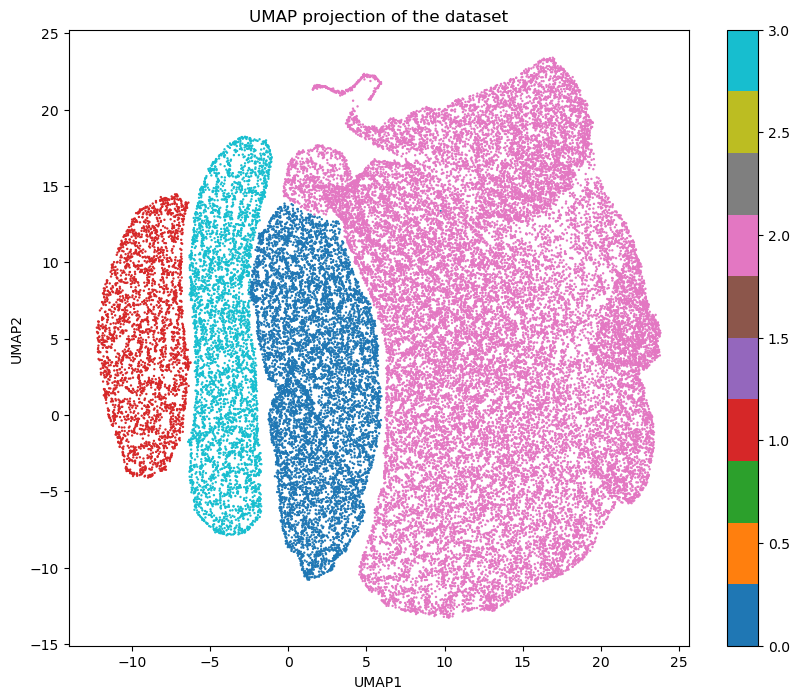

In [7]:

X_scaled = new_X


reducer = umap.UMAP(
    n_neighbors=20,  
    min_dist=.6,   
    n_components=2, 
    metric='euclidean' 
)


embedding = reducer.fit_transform(X_scaled)

plt.figure(figsize=(10, 8))
plt.scatter(embedding[:, 0], embedding[:, 1],c=new_labels, cmap='tab10', s=.5)
plt.title('UMAP projection of the dataset')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.colorbar()
plt.show()

# 2 Clustering

In [8]:
import matplotlib.pyplot as plt
import matplotlib as mpl
#
mpl.rcParams['ps.useafm'] = True
mpl.rcParams['pdf.use14corefonts'] = True
mpl.rcParams['text.usetex'] = False 

In [9]:
df=pd.read_csv(r'data/data_p3/cluster_data_plot.csv')

In [10]:
news=np.array(df[[str(c+1) for c in range(124)]])

d:\anc\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\anc\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


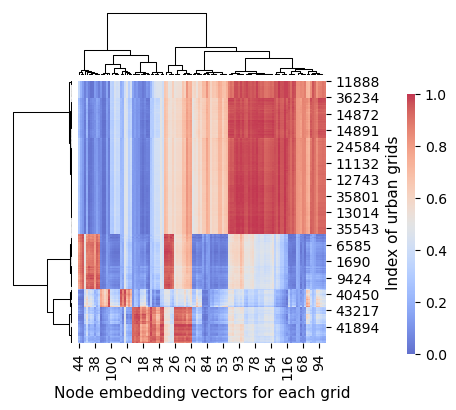

In [11]:
plt.rcdefaults()

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'
plt.rcParams['lines.linewidth']=.75


tree_kws = {
    'linewidth': .75,
    'linestyle': '-',
    'color': 'black'
}

g=sns.clustermap(news, method='ward', cmap='coolwarm',figsize=(4, 4),metric='euclidean', standard_scale=1,
                 vmax=1,vmin=0,alpha=0.8,tree_kws=tree_kws,
                 cbar_pos=(1.03, 0.1, 0.02, 0.65),col_cluster=True,dendrogram_ratio=(0.2,0.2)) # ward
plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=10)  
plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=10)  # 
#
cbar_ax = g.cax

cbar_ax.tick_params(labelsize=10)  

g.ax_heatmap.set_xlabel('Node embedding vectors for each grid',fontsize=11)
g.ax_heatmap.set_ylabel('Index of urban grids',fontsize=11)
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['ps.fonttype'] = 42 
plt.rcParams['pdf.fonttype'] = 42  
plt.show()


# 3 Spatial distribution

In [3]:
import geopandas as gpd

In [4]:
net1=gpd.read_file(r'data/data_p3/sptatial_distribution.geojson')
beij=gpd.read_file(r'data/data_p3/beijing_net.geojson')

In [5]:
net1[net1['lbe']==0].shape,net1[net1['lbe']==1].shape,net1[net1['lbe']==2].shape,net1[net1['lbe']==3].shape

((19248, 5), (1681, 5), (21865, 5), (4078, 5))

C:\Users\123\AppData\Local\Temp\ipykernel_712\2852162281.py:17: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax,alpha=0.9)
C:\Users\123\AppData\Local\Temp\ipykernel_712\2852162281.py:17: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax,alpha=0.9)
C:\Users\123\AppData\Local\Temp\ipykernel_712\2852162281.py:17: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax,alpha=0.9)
C:\Users\123\AppData\Local\Temp\ipykernel_712\2852162281.py:17: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax,alpha=0.9)


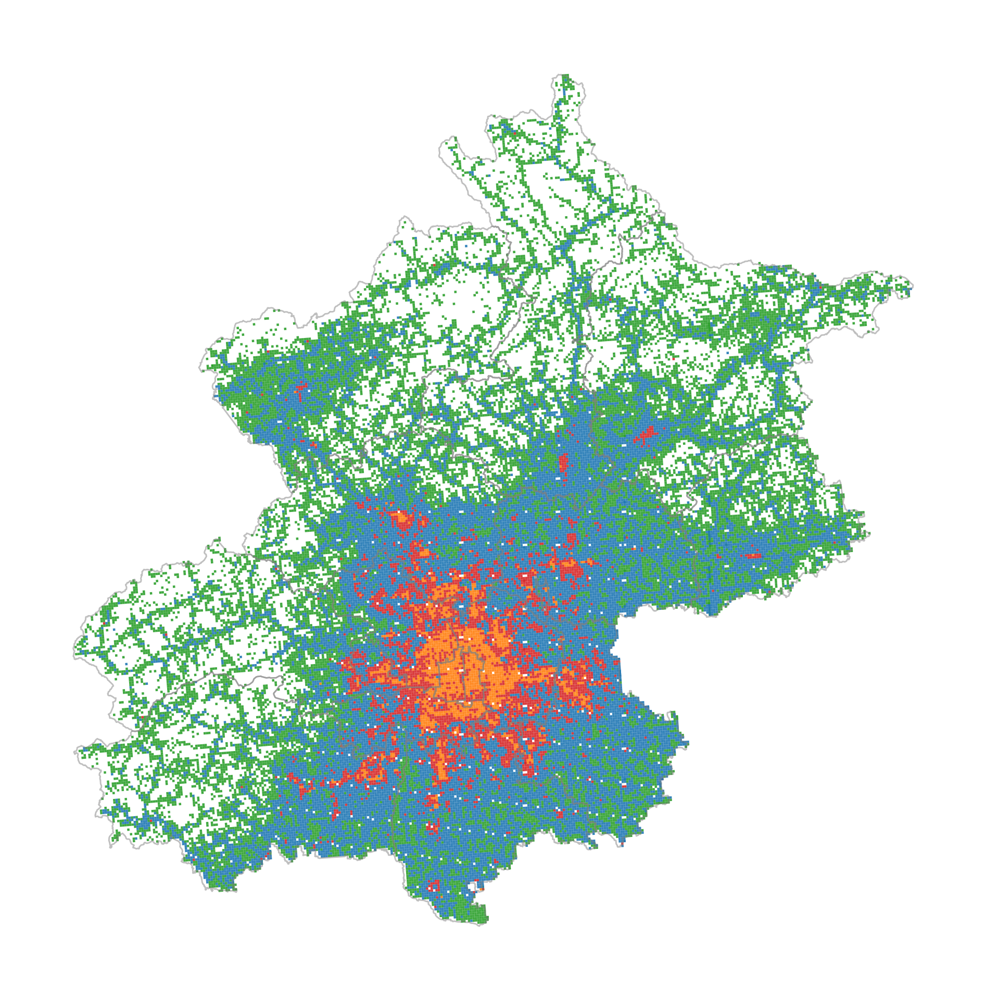

In [15]:
fig, ax = plt.subplots(1,1,figsize=(4,3),dpi=600)

plt.rcdefaults()

plt.rcParams['axes.edgecolor'] = 'none'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'none'
plt.rcParams['ytick.color'] = 'none'

#
ax.tick_params(axis='both',          # 应用于x轴和y轴的设置
               which='both',        # 应用于主刻度线
               length=0,             # 刻度线长度         # 刻度线颜色
               labelsize=0)    # 刻度线方向：向内向外
#
for i in [2,1,3,0]:
    net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax,alpha=0.9)
# net1
beij.plot(ax=ax,facecolor='None',edgecolor='gray',alpha=0.5,linewidth=0.351)
# plt.grid(linewidth=0.35,alpha=0.5)
ax = plt.gca()  # 获取当前轴对象
ax.set_axis_off()
plt.tight_layout(pad=0)
plt.rcParams['svg.fonttype'] = 'none'

plt.rcParams['pdf.fonttype'] = 42  # 也适用于PDF



C:\Users\123\AppData\Local\Temp\ipykernel_19140\4218997647.py:19: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax[id1][id2],alpha=0.95,linewidth=1.5)
C:\Users\123\AppData\Local\Temp\ipykernel_19140\4218997647.py:19: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax[id1][id2],alpha=0.95,linewidth=1.5)
C:\Users\123\AppData\Local\Temp\ipykernel_19140\4218997647.py:19: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax[id1][id2],alpha=0.95,linewidth=1.5)
C:\Users\123\AppData\Local\Temp\ipykernel_19140\4218997647.py:19: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax[id1][id2],al

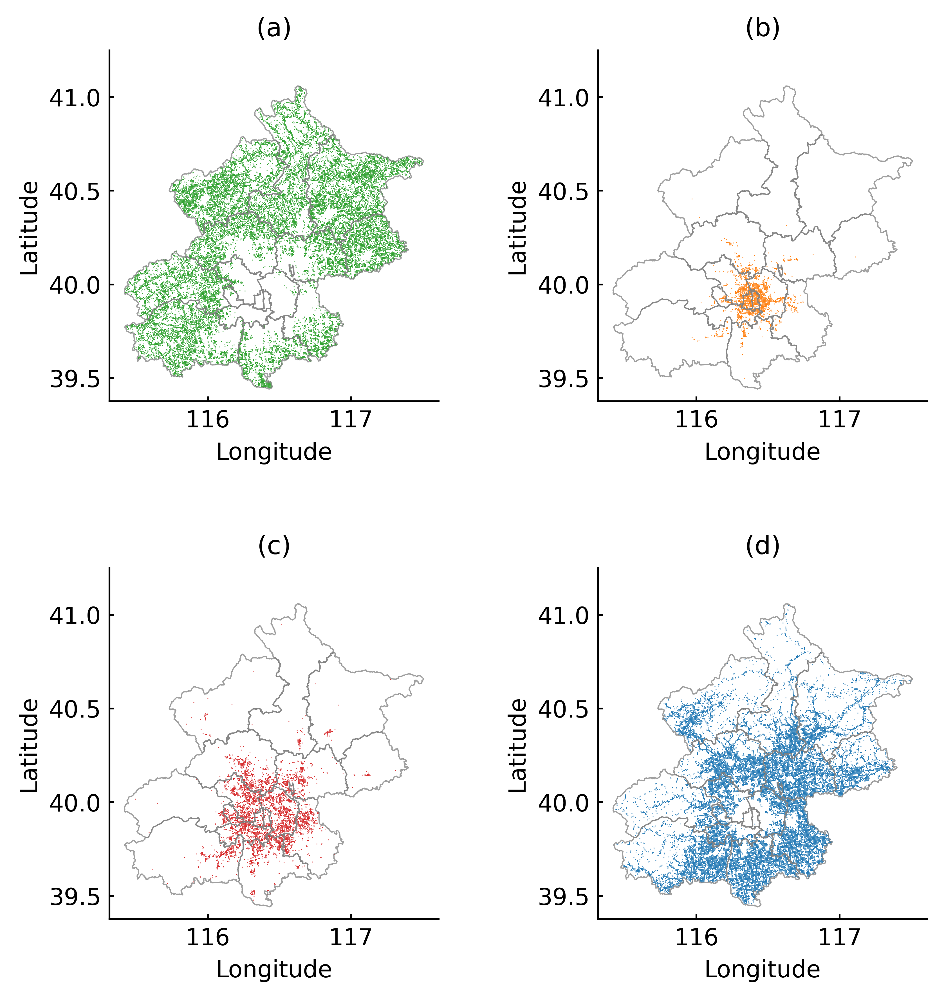

In [ ]:
fig, ax = plt.subplots(2,2,figsize=(6,6),dpi=600)
plt.rcdefaults()

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'
plt.rcParams['lines.linewidth']=.75
#
t=0
id1=0
id2=0
tls=['(a)','(b)','(c)','(d)']
cc=0
for i in [2,1,3,0]:
    if t==2:
        id1=1
        id2=0
    net1[net1['lbe']==i].plot(column='lbe', color=plt.cm.tab10(i), legend=False, ax=ax[id1][id2],alpha=0.95,linewidth=1.5)
    beij.plot(ax=ax[id1][id2],facecolor='None',edgecolor='gray',alpha=0.75,linewidth=0.51)
    plt.tick_params(axis='both', which='major', labelsize=9)
  
    ax[id1][id2].spines['top'].set_visible(False) 
    ax[id1][id2].spines['right'].set_visible(False) 
    ax[id1][id2].set_ylim(39.377,41.25)
    ax[id1][id2].tick_params(axis='both',        
               which='major',        
               length=2,             
               width=.75,             
               color='black',          
               labelsize=10,         
               direction='in')    
    ax[id1][id2].set_title(tls[cc],fontsize=11)
    cc=cc+1
    # plt.grid(alpha=0.35)
    ax[id1][id2].set_xlabel('Longitude',fontsize=10)
    ax[id1][id2].set_ylabel('Latitude',fontsize=10)
    t=t+1
    id2=id2+1
plt.tight_layout(pad=1,h_pad=3)
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['ps.fonttype'] = 42 
plt.rcParams['pdf.fonttype'] = 42 



# 4 carbon emssion reductions

In [8]:
out=pd.read_feather(r'data/data_p3/features_of_clusters.feather')


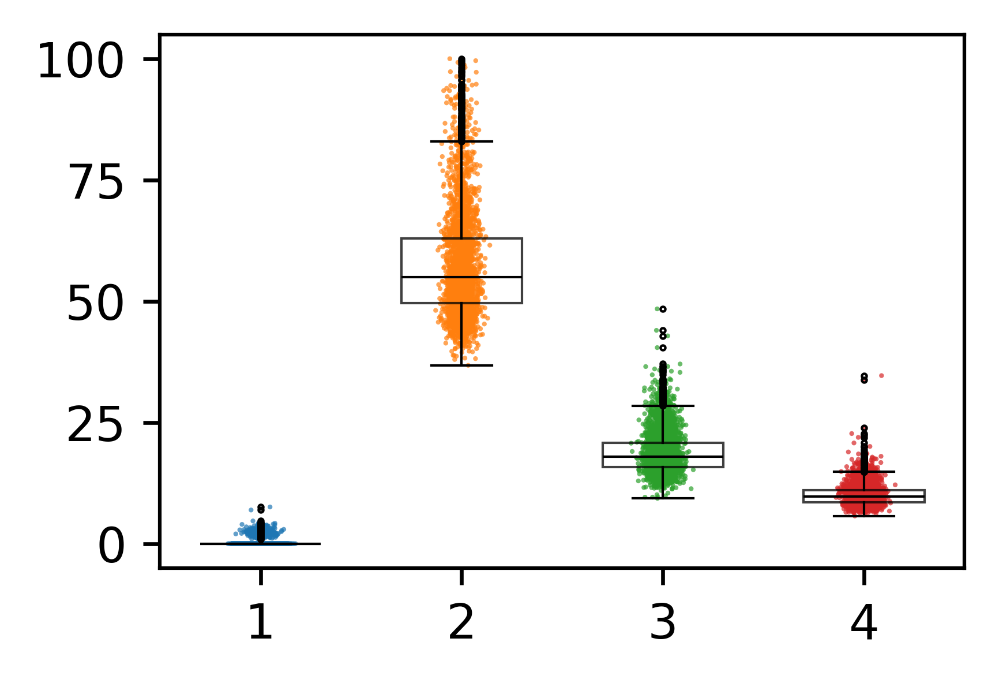

In [18]:
# Corrected simulation for four groups
data1 = np.array(out[out['lbe']==0]['carbon'])
data2 = np.array(out[out['lbe']==1]['carbon'])
data3 = np.array(out[out['lbe']==2]['carbon'])
data4 = np.array(out[out['lbe']==3]['carbon'])


fig, ax = plt.subplots(figsize=(3,2),dpi=600)
flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)

# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1




plt.rcParams['svg.fonttype'] = 'none'

plt.show()


# 5  Mode shift

### bus

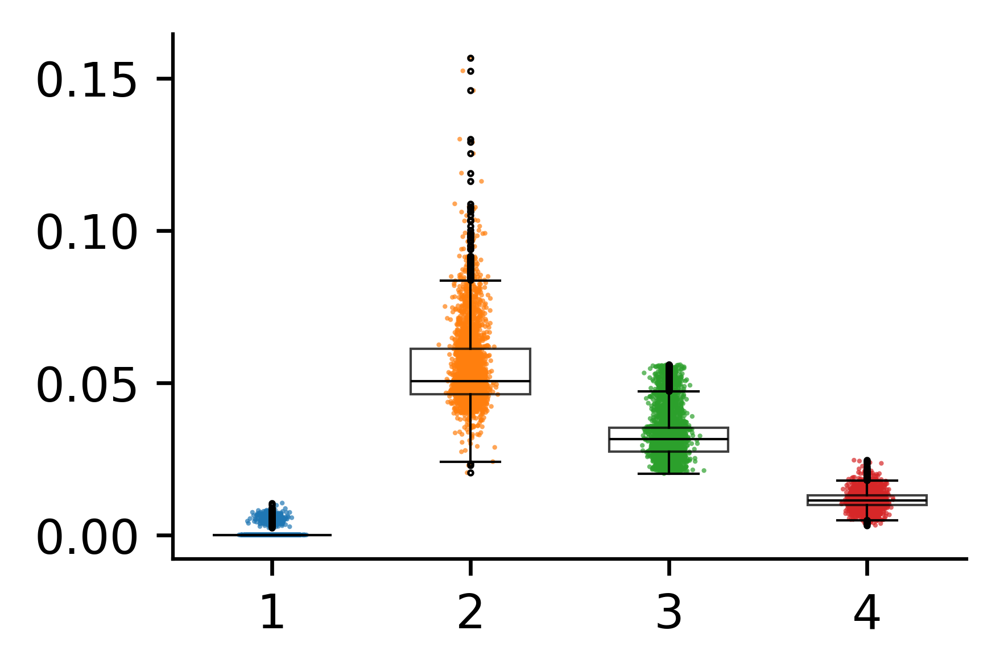

In [10]:
# Corrected simulation for four groups
data1 = np.array(out[(out['lbe']==0)]['bus_ratio'])
data2 = np.array(out[out['lbe']==1]['bus_ratio'])
data3 = np.array(out[(out['lbe']==2)]['bus_ratio'])
data4 = np.array(out[out['lbe']==3]['bus_ratio'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(3,2),dpi=600)
plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'
plt.rcParams['lines.linewidth']=.75
#

flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)
ax.spines['top'].set_visible(False) 
ax.spines['right'].set_visible(False) 
# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1




plt.rcParams['svg.fonttype'] = 'none'
plt.savefig(r'fig_1.svg',dpi=600)

plt.show()


### subway

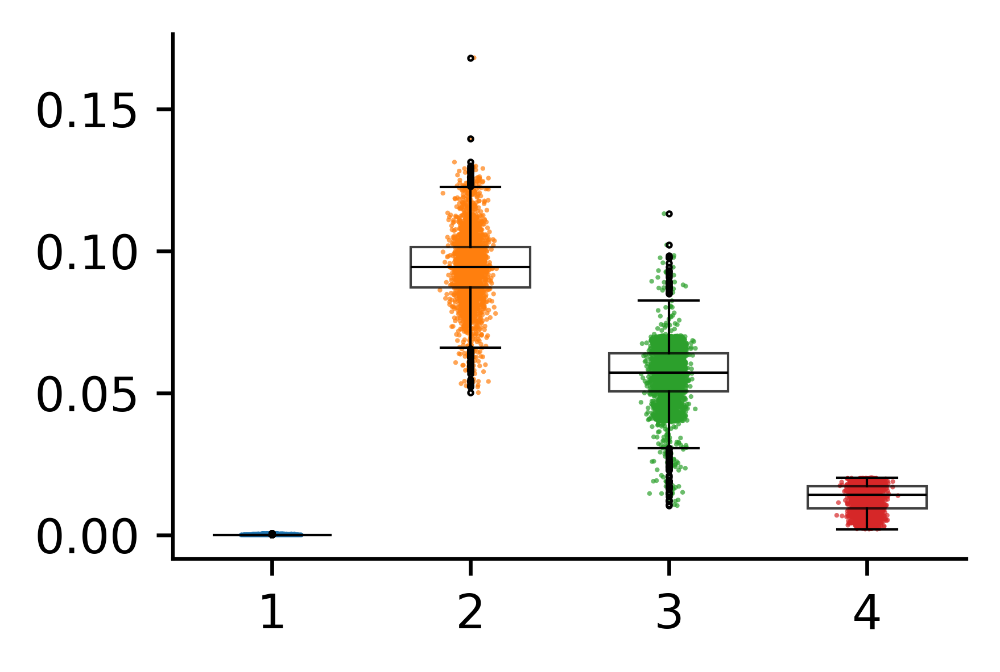

In [12]:
# Corrected simulation for four groups
data1 = np.array(out[(out['lbe']==0)]['sub_ratio'])
data2 = np.array(out[out['lbe']==1]['sub_ratio'])
data3 = np.array(out[(out['lbe']==2)]['sub_ratio'])
data4 = np.array(out[out['lbe']==3]['sub_ratio'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(3,2),dpi=600)

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'
plt.rcParams['lines.linewidth']=.75


flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)
ax.spines['top'].set_visible(False) 
ax.spines['right'].set_visible(False) 
# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1




plt.rcParams['svg.fonttype'] = 'none'
plt.savefig(r'fig_2.svg',dpi=600)

plt.show()


### bike

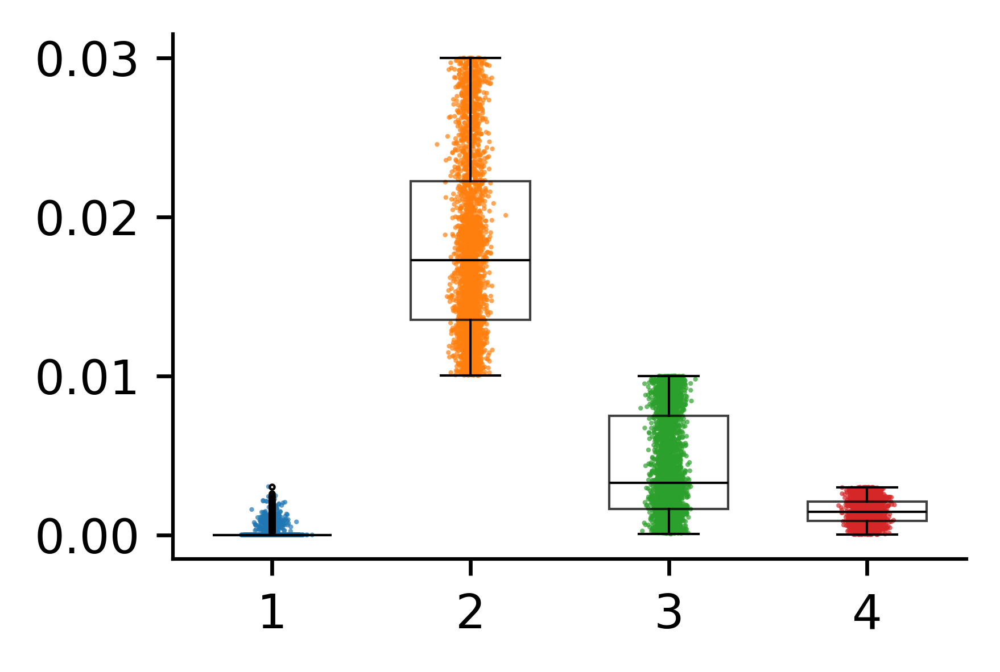

In [13]:
# Corrected simulation for four groups
data1 = np.array(out[(out['lbe']==0)]['bk_ratio'])
data2 = np.array(out[out['lbe']==1]['bk_ratio'])
data3 = np.array(out[(out['lbe']==2)]['bk_ratio'])
data4 = np.array(out[out['lbe']==3]['bk_ratio'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(3,2),dpi=600)

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'
plt.rcParams['lines.linewidth']=.75

flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)

# Adding scatter data for individual data points
ax.spines['top'].set_visible(False) 
ax.spines['right'].set_visible(False) 
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1




plt.rcParams['svg.fonttype'] = 'none'
plt.savefig(r'fig_3.svg',dpi=600)
plt.show()


### reductions in car trips

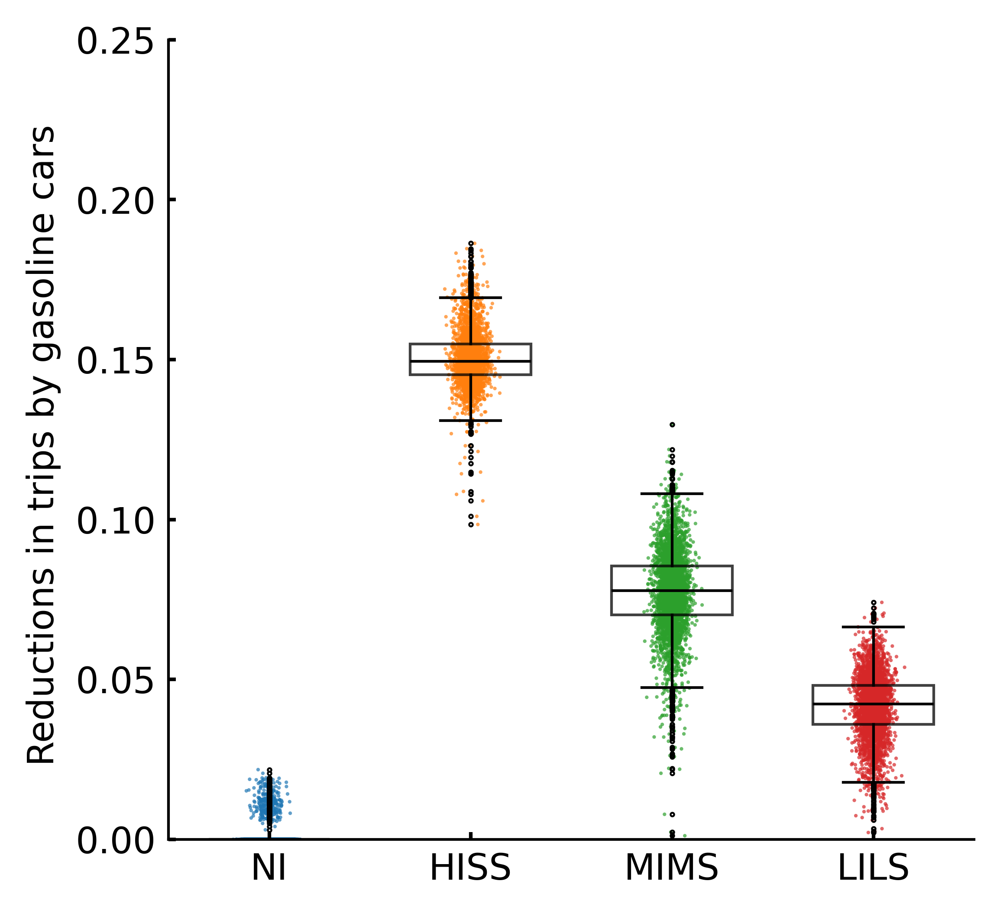

In [22]:
# Corrected simulation for four groups
data1 = np.array(out[out['lbe']==0]['car_reduce'])
data2 = np.array(out[out['lbe']==1]['car_reduce'])
data3 = np.array(out[out['lbe']==2]['car_reduce'])
data4 = np.array(out[out['lbe']==3]['car_reduce'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(4,4),dpi=600)

plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['axes.linewidth'] =1
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'


flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.75),
                whiskerprops=dict(color='black',linewidth=0.75),
                capprops=dict(color='black',linewidth=0.75),
                medianprops=dict(color='black',linewidth=0.75),flierprops=flierprops)

# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1

# Axis settings
ax.set_ylim(0, 0.25)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["MI","HICS","MIMS","LILS"],fontsize=6)
ax.set_ylabel('Avergage carbon\nemission reductions',fontsize=7)
ax.tick_params(axis='both',         
               which='major',      
               length=2,            
               width=1,           
               color='black',      
               labelsize=10,direction='in')      
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Axis settings
# ax.set_ylim(0, 95)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["NI","HISS","MIMS","LILS"],fontsize=10)
ax.set_ylabel('Reductions in trips by gasoline cars ',fontsize=10)



plt.rcParams['svg.fonttype'] = 'none'



plt.show()


# 6 carbon emission reductions

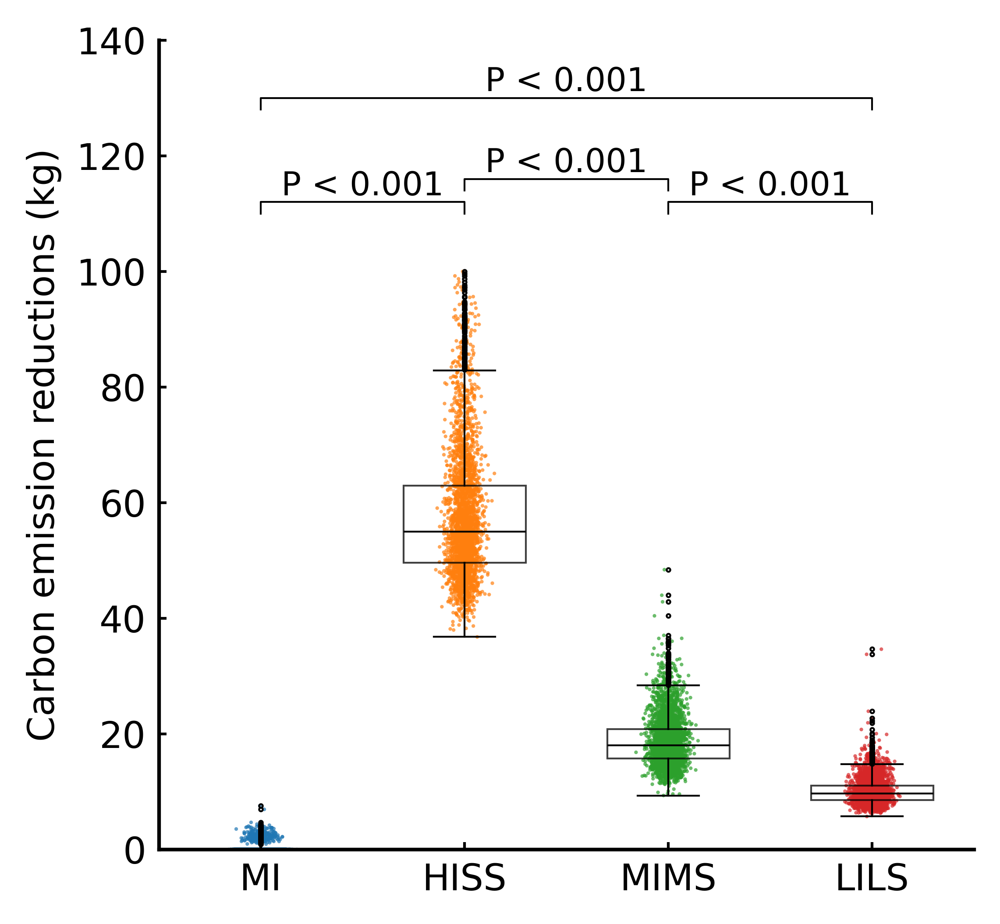

In [23]:
# Corrected simulation for four groups
data1 = np.array(out[out['lbe']==0]['carbon'])
data2 = np.array(out[out['lbe']==1]['carbon'])
data3 = np.array(out[out['lbe']==2]['carbon'])
data4 = np.array(out[out['lbe']==3]['carbon'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(4,4),dpi=600)
flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)

# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1


# Adding significance bars
# Horizontal lines
ax.plot([1, 1, 4, 4],np.array([118, 120, 120, 118])+10, lw=.5, c='black')  # Group 1 to Group 4
ax.plot([1, 1, 2, 2],np.array([118, 120, 120, 118])-8, lw=.5, c='black')  # Group 1 to Group 2
ax.plot([2, 2, 3, 3],np.array([118, 120, 120, 118])-4, lw=.5, c='black')  # Group 2 to Group 3
ax.plot([3, 3, 4, 4], np.array([118, 120, 120, 118])-8, lw=.5, c='black')  # Group 3 to Group 4

# # Text annotations for p-values
ax.text(2.5, 130, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 1 to Group 4
ax.text(1.5,112, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 1 to Group 2
ax.text(2.5, 116, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 2 to Group 3
ax.text(3.5, 112, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 3 to Group 4

# Axis settings
ax.set_ylim(0, 140)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["MI","HICS","MIMS","LILS"],fontsize=6)
ax.set_ylabel('Avergage carbon\nemission reductions',fontsize=7)
ax.tick_params(axis='both',         
               which='major',      
               length=2,            
               width=0.75,            
               color='black',       
               labelsize=10,direction='in')  
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Axis settings
# ax.set_ylim(0, 95)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["MI","HISS","MIMS","LILS"],fontsize=10)
ax.set_ylabel('Carbon emission reductions (kg)',fontsize=10)




plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['ps.fonttype'] = 42  
plt.rcParams['pdf.fonttype'] = 42  


# 7 difference of the distanceds to urban center for clusters

In [24]:
net3=gpd.read_file(r'data/data_p3/distance_distribution.geojson')


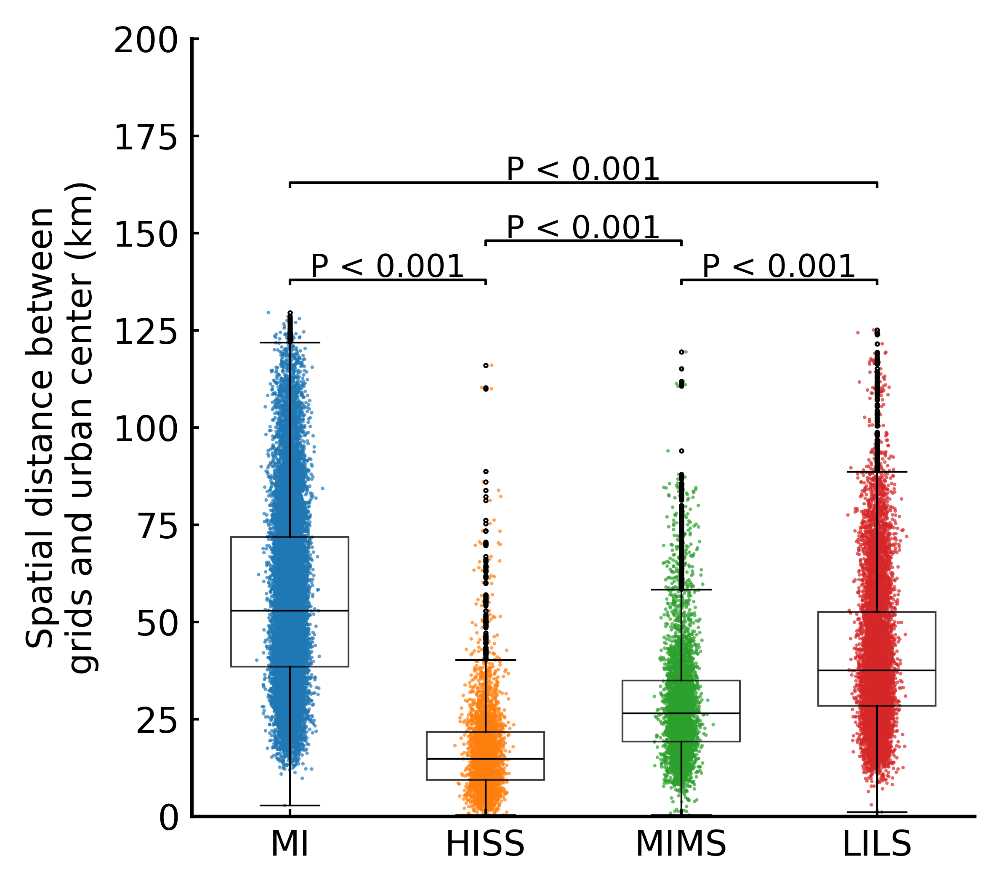

In [25]:
# Corrected simulation for four groups
data1 = np.array(net3[net3['lbe']==0]['distance'])
data2 = np.array(net3[net3['lbe']==1]['distance'])
data3 = np.array(net3[net3['lbe']==2]['distance'])
data4 = np.array(net3[net3['lbe']==3]['distance'])

# Creating the boxplot with 4 groups
fig, ax = plt.subplots(figsize=(4,4),dpi=600)
flierprops = dict(marker='o', markerfacecolor='none', markersize=0.5, linestyle='none')
bp = ax.boxplot([data1, data2, data3, data4], positions=[1, 2, 3, 4],
                widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='none', color='black',alpha=0.75,linewidth=0.5),
                whiskerprops=dict(color='black',linewidth=0.5),
                capprops=dict(color='black',linewidth=0.5),
                medianprops=dict(color='black',linewidth=0.5),flierprops=flierprops)

# Adding scatter data for individual data points
t=0
for i, data in enumerate([data1, data2, data3, data4], 1):
    y = data
    x = np.random.normal(i, 0.04, size=len(data))
    ax.scatter(x, y, alpha=0.7, color=plt.cm.tab10(t), edgecolor='none',s=1)
    t=t+1


# Adding significance bars
# Horizontal lines
ax.plot([1, 1, 4, 4],np.array([149, 150, 150, 149])+13, lw=.75, c='black')  # Group 1 to Group 4
ax.plot([1, 1, 2, 2],np.array([149, 150, 150, 149])-12, lw=.75, c='black')  # Group 1 to Group 2
ax.plot([2, 2, 3, 3],np.array([149, 150, 150, 149])-2, lw=.75, c='black')  # Group 2 to Group 3
ax.plot([3, 3, 4, 4], np.array([149, 150, 150, 149])-12, lw=.75, c='black')  # Group 3 to Group 4

# # Text annotations for p-values
ax.text(2.5, 162, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 1 to Group 4
ax.text(1.5,137, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 1 to Group 2
ax.text(2.5, 147, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 2 to Group 3
ax.text(3.5, 137, 'P < 0.001', ha='center', va='bottom', fontsize=9)  # Group 3 to Group 4

# Axis settings
ax.set_ylim(0, 200)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["MI","HICS","MIMS","LILS"],fontsize=6)
ax.set_ylabel('Avergage carbon\nemission reductions',fontsize=7)
ax.tick_params(axis='both',          # 应用于x轴和y轴的设置
               which='major',        # 应用于主刻度线
               length=2,             # 刻度线长度
               width=0.75,              # 刻度线宽度
               color='black',          # 刻度线颜色
               labelsize=10,direction='in')         # 刻度标签大小
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Axis settings
# ax.set_ylim(0, 95)
ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(["MI","HISS","MIMS","LILS"],fontsize=10)
ax.set_ylabel('Spatial distance between\ngrids and urban center (km)',fontsize=10)




plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['ps.fonttype'] = 42  # Type 42 (TrueType)字体，可编辑的嵌入字体
plt.rcParams['pdf.fonttype'] = 42  # 也适用于PDF

plt.show()


# 8 mode_shifts caused by trips among clusters

In [28]:
import matplotlib.colors as mcolors
from pycirclize import Circos
import pandas as pd

In [29]:
def plot_cir(odm,aa2,vmax,kd):
        
    # Create matrix dataframe (3 x 6)
    row_names = ["NI (origin)", "NI (destination)", "HISS (origin)",
                "HISS (destination)","MIMS (origin)", "MIMS (destination)", 
                "LILS (origin)","LILS (destination)"]
    col_names = ["NI (origin)", "NI (destination)", "HISS (origin)",
                "HISS (destination)","MIMS (origin)", "MIMS (destination)", 
                "LILS (origin)","LILS (destination)"]

    matrix_df =pd.DataFrame(odm*1, index=row_names, columns=col_names)
    sectors = {"NI (origin)": 4, "NI (destination)": 4,
            "HISS (origin)": 4,"HISS (destination)": 4,
            "MIMS (origin)": 4, "MIMS (destination)": 4,
            "LILS (origin)": 4, "LILS (destination)": 4}
    circos = Circos(sectors, space=[2,12,2,12,2,12,2,12])
    row_names = ["NI\n(origin)", "NI\n(destination)", "HISS\n(origin)",
                "HISS\n(destination)","MIMS\n(origin)", "MIMS\n(destination)", 
                "LILS\n(origin)","LILS\n(destination)"]
    kkk=0
    for sector in circos.sectors:
        # Plot sector name
        sector.text(f"{row_names[kkk]}", r=82, size=8)
        kkk=kkk+1
        # Create x positions & random y values
        if sector.name[-3]=="i":
            x = np.arange(sector.start, sector.end) + 0.5
            y = np.array(matrix_df.loc[sector.name,["NI (destination)","HISS (destination)",
                                                    "MIMS (destination)","LILS (destination)"]])
            track3 = sector.add_track((60, 80), r_pad_ratio=0.1)
            track3.axis()
            bt=track3.bar(x, y,vmax=vmax,width=0.5) #,color=[mapper.cmap(y[0]),mapper.cmap(y[1]),mapper.cmap(y[2]),mapper.cmap(y[3])]
            
        else:
            # print('/')
            x = np.arange(sector.start, sector.end) + 0.5
            y = np.array(matrix_df.loc[["NI (origin)","HISS (origin)",
                                        "MIMS (origin)","LILS (origin)"],sector.name])
            track3 = sector.add_track((60, 80), r_pad_ratio=0.1)
            track3.axis()
            track3.bar(x, y,vmax=vmax,width=0.5) #,color=[mapper.cmap(y[0]),mapper.cmap(y[1]),mapper.cmap(y[2]),mapper.cmap(y[3])]
        
    aa3=aa2*kd
    lw=0.5
    alpha=0.75
    cmp=(aa3-aa3.min())/(aa3.max()-aa3.min())
    mapper=plt.cm.Oranges

    circos.link(("NI (origin)", 0.5-aa3[0,0]/2, 0.5+aa3[0,0]/2), ("NI (destination)", 0.5-aa3[0,0]/2, 0.5+aa3[0,0]/2),
                direction=1, color=mapper(cmp[0,0]), ec=mapper(cmp[0,0]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("NI (origin)", 1.5-aa3[0,1]/2, 1.5+aa3[0,1]/2), ("HISS (destination)",  0.5-aa3[0,1]/2, 0.5+aa3[0,1]/2),
                direction=1, color=mapper(cmp[0,1]), ec=mapper(cmp[0,1]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("NI (origin)", 2.5-aa3[0,2]/2, 2.5+aa3[0,2]/2), ("MIMS (destination)", 0.5-aa3[0,2]/2, 0.5+aa3[0,2]/2),
                direction=1, color=mapper(cmp[0,2]), ec=mapper(cmp[0,2]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("NI (origin)", 3.5-aa3[0,3]/2, 3.5+aa3[0,3]/2), ("LILS (destination)", 0.5-aa3[0,3]/2, 0.5+aa3[0,3]/2),
                direction=1, color=mapper(cmp[0,3]), ec=mapper(cmp[0,3]), lw=lw,allow_twist=False,alpha=alpha)
    # #

    circos.link(("HISS (origin)", 1.5-aa3[1,0]/2, 1.5+aa3[1,0]/2), ("NI (destination)", 1.5-aa3[1,0]/2, 1.5+aa3[1,0]/2),
                direction=1, color=mapper(cmp[1,0]), ec=mapper(cmp[1,0]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("HISS (origin)", 2.5-aa3[1,1]/2, 2.5+aa3[1,1]/2), ("HISS (destination)", 1.5-aa3[1,1]/2, 1.5+aa3[1,1]/2),
                direction=1, color=mapper(cmp[1,1]), ec=mapper(cmp[1,1]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("HISS (origin)", 3.5-aa3[1,2]/2, 3.5+aa3[1,2]/2), ("MIMS (destination)",1.5-aa3[1,2]/2, 1.5+aa3[1,2]/2),
                direction=1, color=mapper(cmp[1,2]), ec=mapper(cmp[1,2]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("HISS (origin)", 0.5-aa3[1,3]/2, 0.5+aa3[1,3]/2), ("LILS (destination)", 1.5-aa3[1,3]/2, 1.5+aa3[1,3]/2),
                direction=1, color=mapper(cmp[1,3]), ec=mapper(cmp[1,3]), lw=lw,allow_twist=False,alpha=alpha)
    #
    circos.link(("MIMS (origin)", 1.5-aa3[2,0]/2, 1.5+aa3[2,0]/2), ("NI (destination)", 2.5-aa3[2,0]/2, 2.5+aa3[2,0]/2),
                direction=1, color=mapper(cmp[2,0]), ec=mapper(cmp[2,0]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("MIMS (origin)", 2.5-aa3[2,1]/2, 2.5+aa3[2,1]/2), ("HISS (destination)", 2.5-aa3[2,1]/2, 2.5+aa3[2,1]/2),
                direction=1, color=mapper(cmp[2,1]), ec=mapper(cmp[2,1]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("MIMS (origin)", 3.5-aa3[2,2]/2, 3.5+aa3[2,2]/2), ("MIMS (destination)",2.5-aa3[2,2]/2, 2.5+aa3[2,2]/2),
                direction=1, color=mapper(cmp[2,2]), ec=mapper(cmp[2,2]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("MIMS (origin)", 0.5-aa3[2,3]/2, 0.5+aa3[2,3]/2), ("LILS (destination)", 2.5-aa3[2,3]/2, 2.5+aa3[2,3]/2),
                direction=1, color=mapper(cmp[2,3]), ec=mapper(cmp[2,3]), lw=lw,allow_twist=False,alpha=alpha)

    #
    circos.link(("LILS (origin)", 1.5-aa3[3,0]/2, 1.5+aa3[3,0]/2), ("NI (destination)", 3.5-aa3[3,0]/2, 3.5+aa3[3,0]/2),
                direction=1, color=mapper(cmp[3,0]), ec=mapper(cmp[3,0]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("LILS (origin)", 2.5-aa3[3,1]/2, 2.5+aa3[3,1]/2), ("HISS (destination)", 3.5-aa3[3,1]/2, 3.5+aa3[3,1]/2),
                direction=1, color=mapper(cmp[3,1]), ec=mapper(cmp[3,1]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("LILS (origin)", 3.5-aa3[3,2]/2, 3.5+aa3[3,2]/2), ("MIMS (destination)", 3.5-aa3[3,2]/2, 3.5+aa3[3,2]/2),
                direction=1, color=mapper(cmp[3,2]), ec=mapper(cmp[3,2]), lw=lw,allow_twist=False,alpha=alpha)
    circos.link(("LILS (origin)", 0.5-aa3[3,3]/2, 0.5+aa3[3,3]/2), ("LILS (destination)", 3.5-aa3[3,3]/2, 3.5+aa3[3,3]/2),
                direction=2, color=mapper(cmp[3,3]), ec=mapper(cmp[3,3]), lw=lw,allow_twist=False,alpha=alpha)
    #
    fig = plt.figure(figsize=(4, 4), dpi=600)
    ax = fig.add_subplot(111, polar=True)

    plt.rcdefaults()

    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0.75
    plt.rcParams['xtick.color'] = 'black'
    plt.rcParams['ytick.color'] = 'black'
    plt.rcParams['lines.linewidth']=.75
    ax.tick_params(axis='both',         
                which='major',     
                length=2,           
                width=.75,          
                color='black',        
                labelsize=19,        
                direction='in')   
    fig=circos.plotfig(ax=ax)
    return fig

In [30]:
def cal_mm(baa4,mode,effc,otname):
    matrix_df = baa4[(baa4['after_mode']==mode)&(baa4['travel_preference']=='fuelcar')][
        ['org_label','dst_label','ratio']].pivot(index='org_label', columns='dst_label', values='ratio').fillna(0)
    aa=matrix_df.to_numpy()
    mode_1=otname
    aa2=((aa.T/np.sum(aa,axis=1))*np.array(effc[mode_1])).T
    #
 
    return aa2
def cal_odm(aa2):
    odm= np.zeros((8, 8), dtype=float)

    # Mapping the 4x4 matrix values to the 8x8 matrix
    for i in range(4):
        for j in range(4):
            odm[2*i, 2*j+1] = aa2[i, j]
    return odm

### subway trips

In [31]:
aa2=np.load(r'data/data_p3//shifts_in_subway_trips_clusters.npz')['embedding']
aa2

array([[0.    , 0.    , 0.    , 0.    ],
       [0.0033, 0.0336, 0.0305, 0.0268],
       [0.0043, 0.0238, 0.0141, 0.0143],
       [0.0033, 0.0033, 0.0033, 0.0033]])

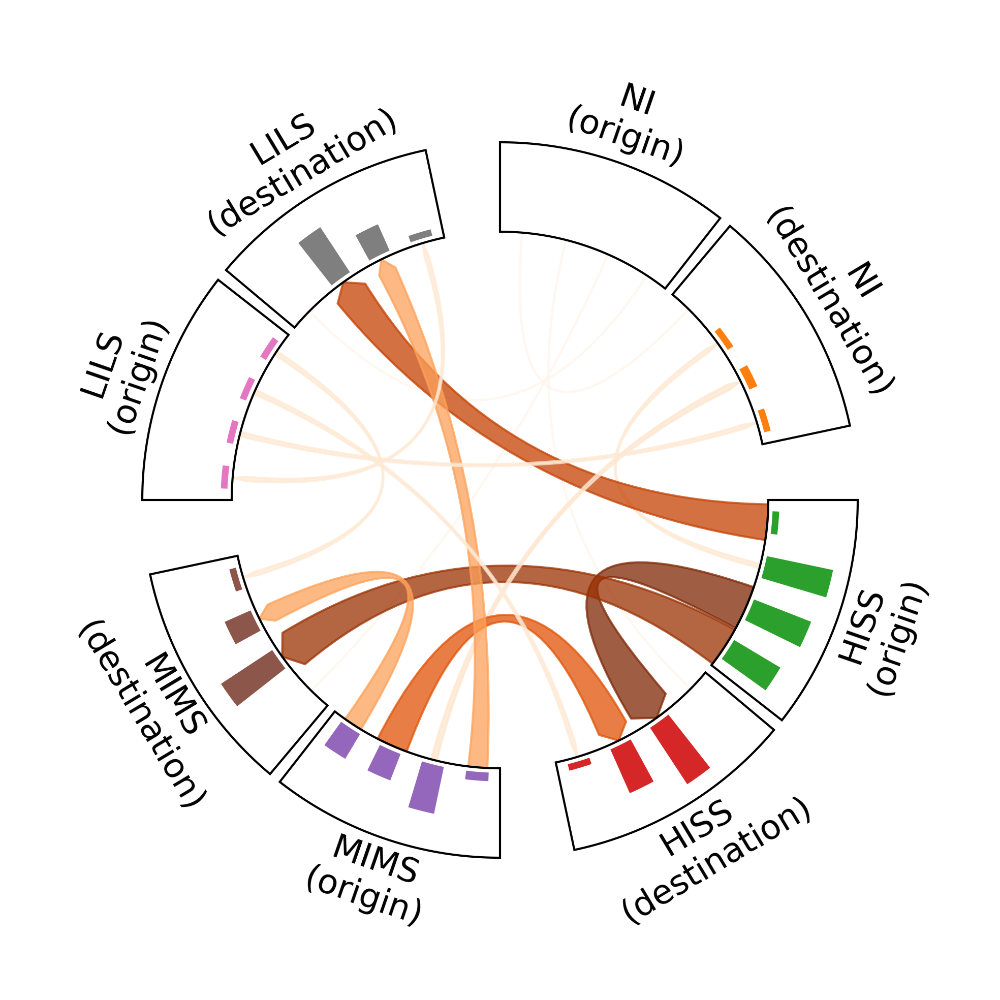

In [32]:
odm=cal_odm(aa2)

fig=plot_cir(odm,aa2,vmax=0.04,kd=30)


### shifts in bus trips

In [33]:
aa2=np.load(r'data/data_p3//shifts_in_bus_trips_clusters.npz')['embedding']
aa2

array([[0.0001, 0.    , 0.    , 0.    ],
       [0.004 , 0.0181, 0.0177, 0.0151],
       [0.008 , 0.0083, 0.0082, 0.0083],
       [0.0011, 0.0046, 0.003 , 0.0029]])

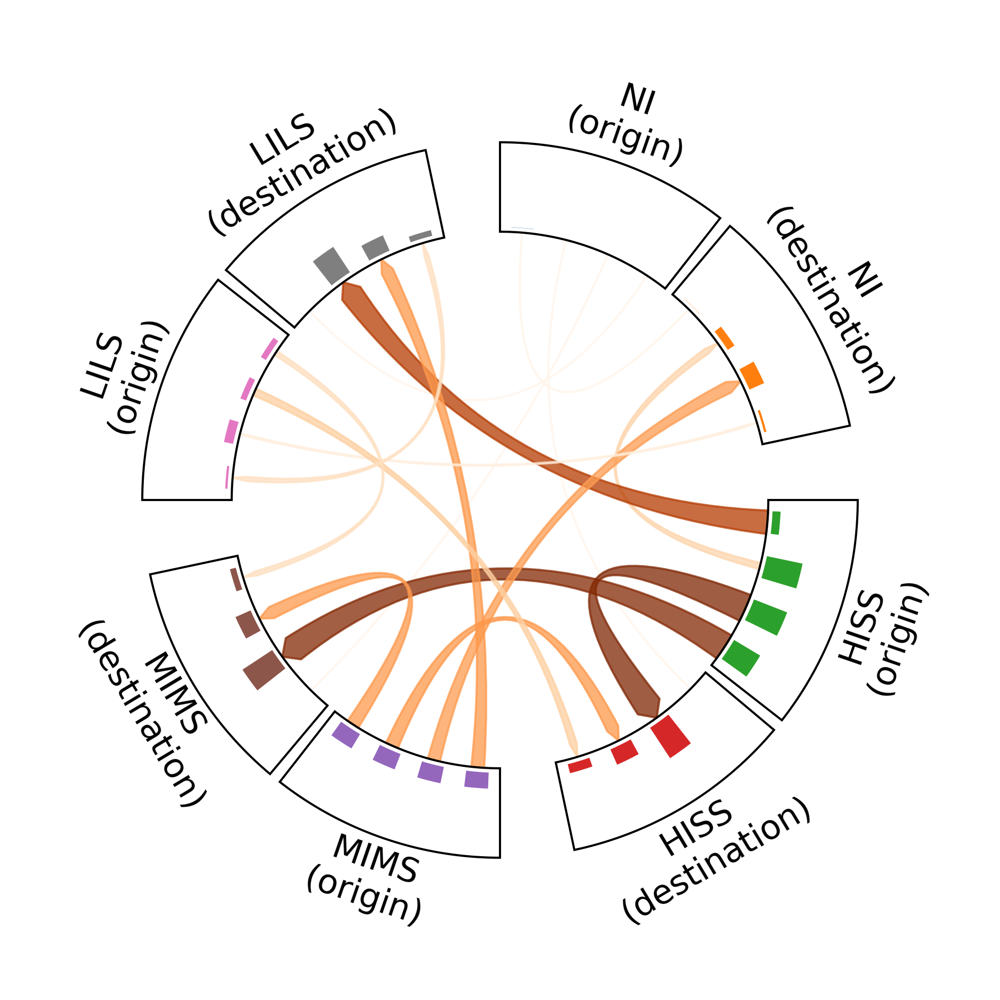

In [34]:


odm=cal_odm(aa2)

fig=plot_cir(odm,aa2,vmax=0.04,kd=35)

plt.rcParams['svg.fonttype'] = 'none'


### shifts in bike trips

In [35]:
aa2=np.load(r'data/data_p3//shifts_in_bike_trips_clusters.npz')['embedding']
aa2

array([[0.    , 0.    , 0.    , 0.    ],
       [0.0015, 0.0067, 0.0056, 0.0044],
       [0.0011, 0.0011, 0.0011, 0.001 ],
       [0.0004, 0.0004, 0.0004, 0.0004]])

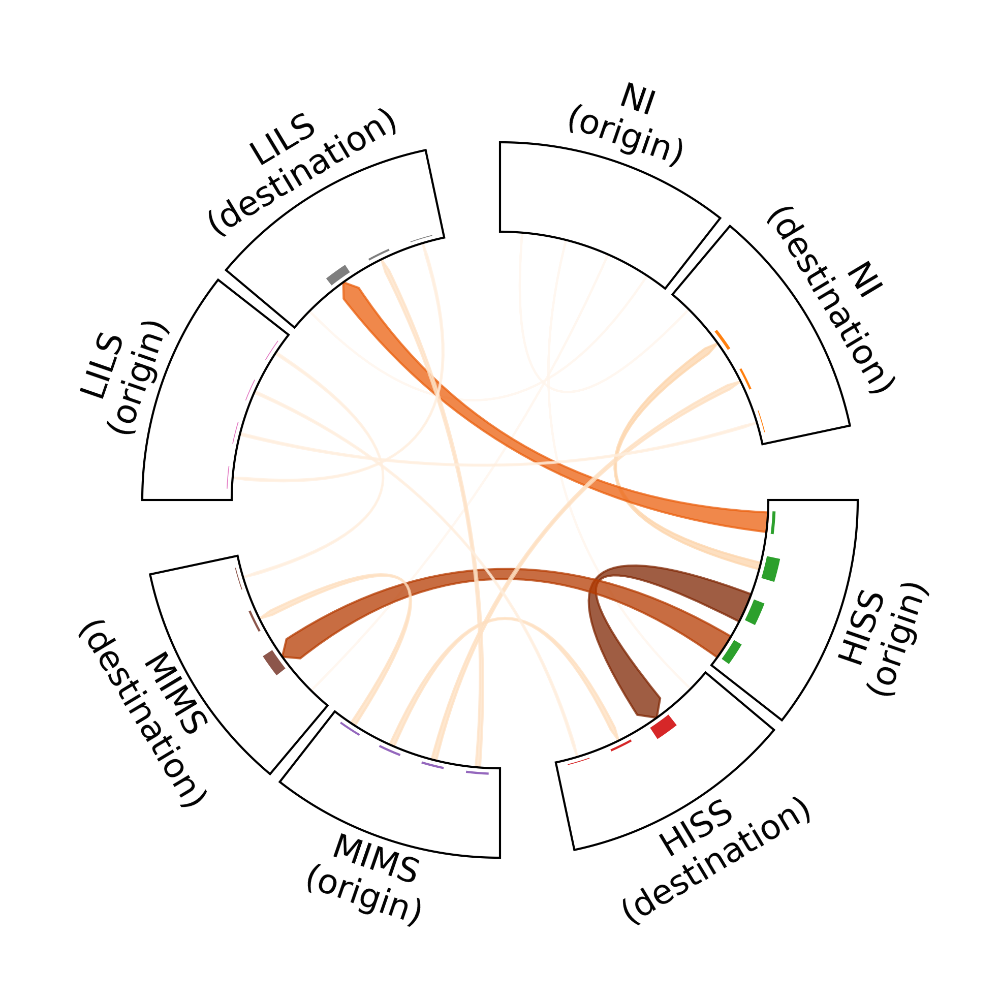

In [36]:


odm=cal_odm(aa2)

fig=plot_cir(odm,aa2,vmax=0.04,kd=100)


# 9 Carbon_emission_reductions cuased by trips among clusters

In [37]:
def cal_mm_c(baa4,mode):
    matrix_df = baa4[(baa4['after_mode']==mode)][
        ['org_label','dst_label','real_carb']].pivot(index='org_label', columns='dst_label', values='real_carb').fillna(0)
    aa=matrix_df.to_numpy()
    #
 
    return aa
def cal_odm_c(aa2):
    odm= np.zeros((8, 8), dtype=float)

    # Mapping the 4x4 matrix values to the 8x8 matrix
    for i in range(4):
        for j in range(4):
            odm[2*i, 2*j+1] = aa2[i, j]
    return odm

### carbon reductions due to shifting to subway trips

In [38]:
aa2=np.load(r'data/data_p3//carbon_emission_reductions_in_subway_trips_clusters.npz')['embedding']
aa2

array([[ 0.   ,  0.   ,  0.   ,  0.   ],
       [ 1.249, 11.424,  6.74 ,  7.111],
       [ 1.72 ,  2.5  ,  2.66 ,  1.828],
       [ 0.932,  2.034,  1.048,  1.073]])

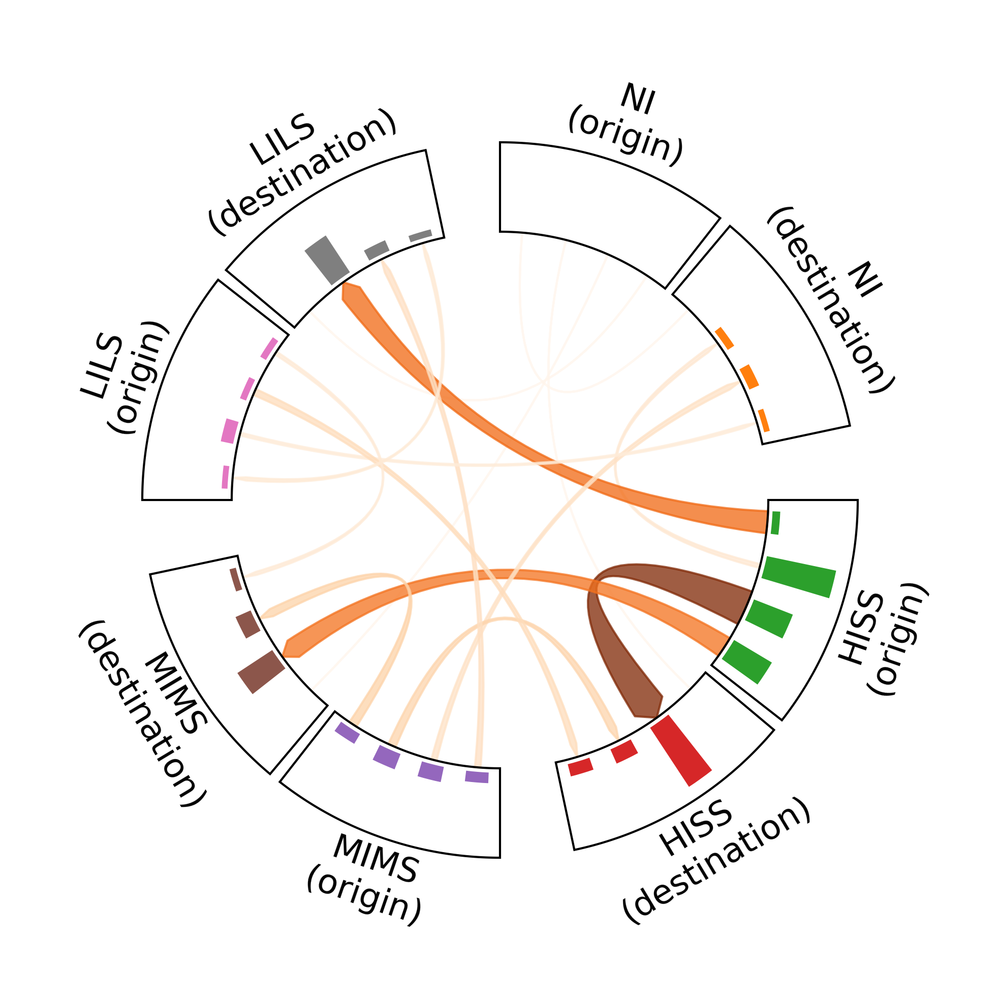

In [39]:

odm=cal_odm_c(aa2)

#
fig=plot_cir(odm,aa2,vmax=13,kd=.07)


### carbon emission reduction due to shifting to bus trips

In [40]:
aa2=np.load(r'data/data_p3//carbon_emission_reductions_in_bus_trips_clusters.npz')['embedding']
aa2

array([[4.65671598e-04, 6.13509169e-05, 5.89565149e-05, 6.38363156e-05],
       [4.55652193e+00, 5.78705042e+00, 7.18451443e+00, 4.65118426e+00],
       [1.28475828e+00, 2.14531598e+00, 2.39161185e+00, 1.18007117e+00],
       [7.02481680e-01, 9.55091819e-01, 9.24972939e-01, 7.42094946e-01]])

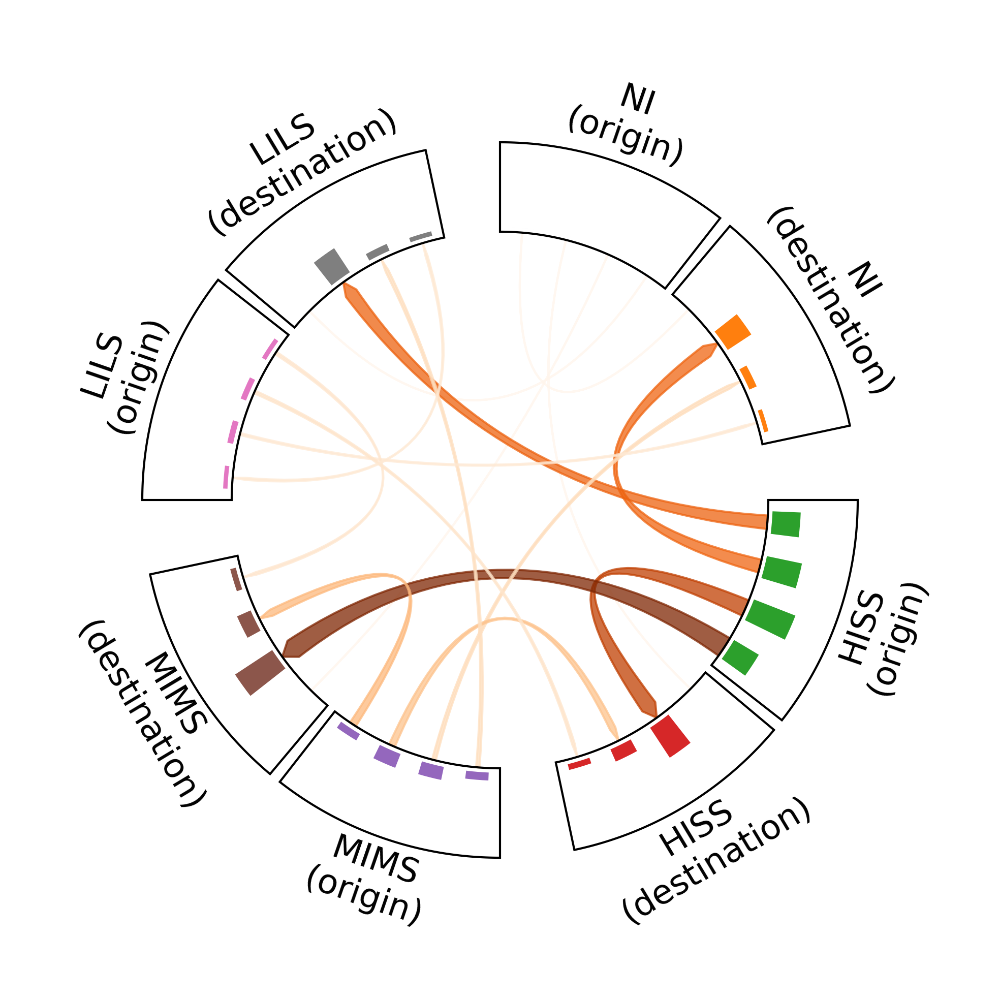

In [41]:

odm=cal_odm_c(aa2)

#
fig=plot_cir(odm,aa2,vmax=13,kd=.065)

plt.rcParams['svg.fonttype'] = 'none'

### carbon emission reduction due to shifting to bike trips

In [42]:
aa2=np.load(r'data/data_p3//carbon_emission_reductions_in_bike_trips_clusters.npz')['embedding']
aa2

array([[2.12987664e-05, 3.83642034e-05, 4.52859619e-05, 2.61871828e-05],
       [1.03933699e+00, 3.50594403e+00, 1.29019878e+00, 1.04354102e+00],
       [5.51029198e-01, 8.76056353e-01, 9.74452728e-01, 5.72808511e-01],
       [2.59759416e-01, 4.82352240e-01, 5.58868283e-01, 3.50110707e-01]])

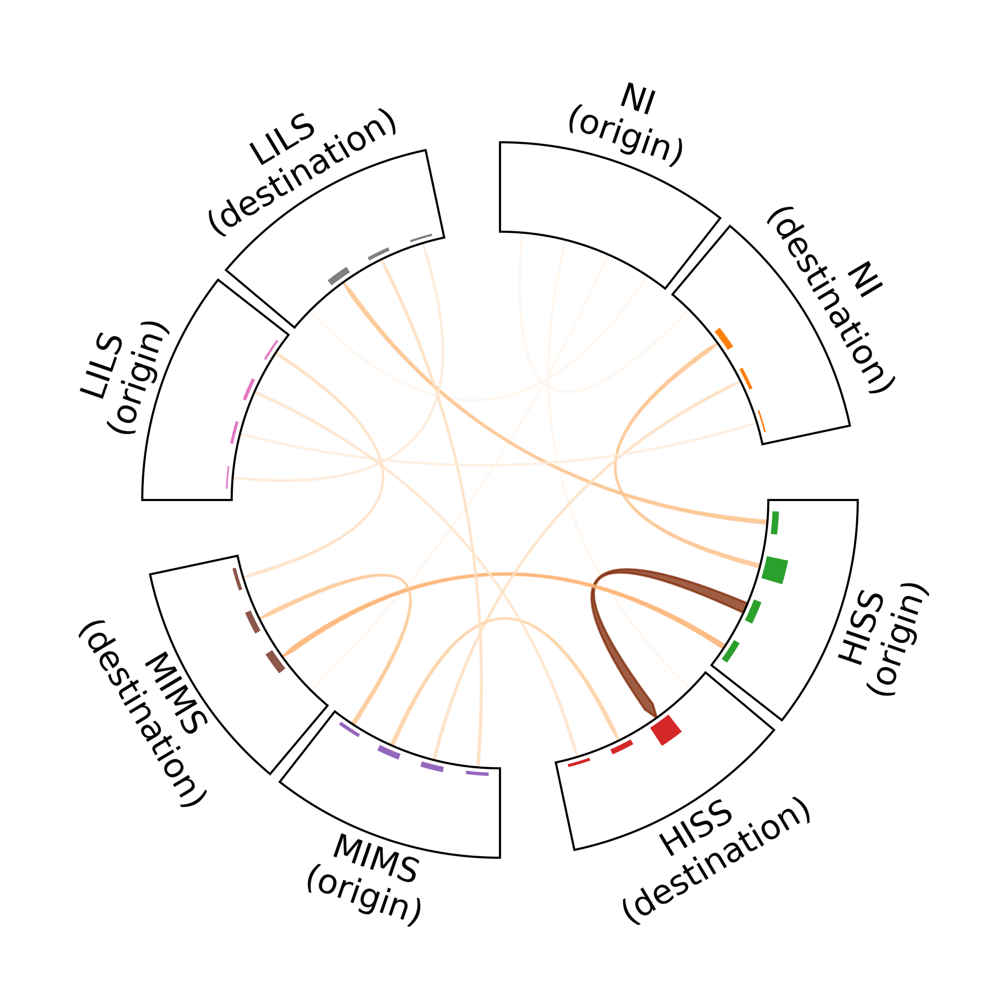

In [43]:
odm=cal_odm_c(aa2)

#
fig=plot_cir(odm,aa2,vmax=13,kd=.065)

plt.rcParams['svg.fonttype'] = 'none'

# 10 Correlation analysis between urban features and incentive effectiveness

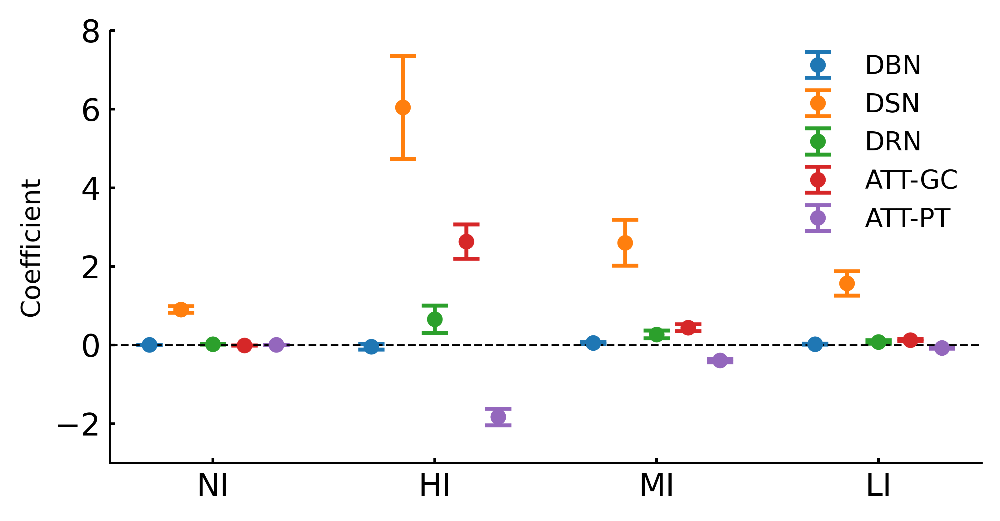

In [ ]:

data = {
    'DBN': [0.0067,-0.0416,0.0531,0.0251],
    'DSN': [0.9043,6.0459,2.6041,1.5703],
    'DRN': [0.0212,0.6556,0.2718,0.0816],
    'ATT-GC': [-0.0069,2.6309,0.4431,0.1294],
    'ATT-PT': [0.0030,-1.8283,-0.3941,-0.0755]
}
df = pd.DataFrame(data)

errors = {
    'DBN': [0.0017,0.0694,0.0251,0.0131],
    'DSN': [0.08330,1.3099,0.5851,0.3073],
    'DRN': [0.00620,0.3476,0.1018,0.0406],
    'ATT-GC': [0.0011,0.4369,0.0901,0.0304],
    'ATT-PT': [0.001,0.2097,0.0409,0.0115]
}
error_df = pd.DataFrame(errors)

plt.rcdefaults()
fig, ax = plt.subplots(figsize=(6, 3),dpi=600)




plt.rcParams['axes.edgecolor'] = 'none'
plt.rcParams['axes.linewidth'] = 0.75
plt.rcParams['xtick.color'] = 'none'
plt.rcParams['ytick.color'] = 'none'

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='both',       
               which='major',       
               length=2,         
               width=0.75,            
               color='black',        
               labelsize=10,direction='in')       



n_groups = 4
index = np.arange(n_groups)
group_spacing = 0.2  # Increased spacing between groups
bar_width = 0.1  # Width of each point's error bar


for i, method in enumerate(df.columns):
    group_positions = index * (len(df.columns) * bar_width + group_spacing) + i * bar_width
    ax.errorbar(group_positions, df[method], yerr=error_df[method], fmt='.', label=method, capsize=5,linewidth=1.5, markersize=10,capthick=1.5)

ax.set_ylim(-3,8)

ax.set_ylabel('Coefficient')

ax.set_xticks(index * (len(df.columns) * bar_width + group_spacing) + bar_width * (len(df.columns) - 1) / 2)
ax.set_xticklabels(['NI','HI','MI','LI'])
ax.axhline(0, color='black', linewidth=0.8, linestyle='--')  


ax.tick_params(axis='both',         
               which='major',      
               length=2,      
               width=1,            
               color='black',  
               labelsize=12,direction='in')

ax.legend(frameon=False,fontsize=10)

plt.rcParams['svg.fonttype']='none'

plt.show()